### **Importing libs**

In [1]:
import tensorflow as tf
from tensorflow.keras.utils import Sequence
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Input, Concatenate, MaxPool2D, UpSampling2D, Add
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.image import resize, random_contrast, random_brightness
from tensorflow.keras.callbacks import LearningRateScheduler
from keras import backend as K
from sklearn.model_selection import train_test_split
import os 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

### **Visualization**

In [1]:
def visualize(img, label, alpha=0.3):
  fig, ax = plt.subplots(1, 3, figsize=(20, 20))
  ax[0].imshow(img)
  ax[0].set_title("Image")

  ax[1].imshow(label)
  ax[1].set_title("Mask")

  ax[2].imshow(img)
  ax[2].imshow(label, alpha=alpha)
  ax[2].set_title("Image with Mask")

In [ ]:
img = img_to_array(load_img("/content/drive/MyDrive/Colab Notebooks/COVID_data/dataset/COVID(58)_json/img.png"))
label = img_to_array(load_img("/content/drive/MyDrive/Colab Notebooks/COVID_data/dataset/COVID(58)_json/label.png"))

label[label == 128.] = 1.

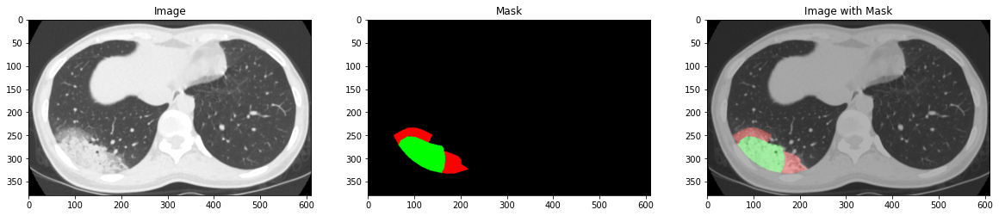

In [14]:
visualize(img.astype(np.uint8), label)

### **Data**

In [22]:
path = "/content/drive/MyDrive/Colab Notebooks/COVID_data/dataset"
names = os.listdir(path)

images = []
masks = []

In [23]:
for name in names:
  images.append(os.path.join(path, name, "img.png"))
  masks.append(os.path.join(path, name, "label.png"))

In [24]:
df = pd.DataFrame({"images": images,
                   "masks": masks})
df

,images,masks
0,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
1,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
2,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
3,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
4,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
...,...,...
385,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
386,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
387,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...
388,/content/drive/MyDrive/Colab Notebooks/COVID_d...,/content/drive/MyDrive/Colab Notebooks/COVID_d...


In [ ]:
train_df, test_df = train_test_split(df, test_size=0.1)
train_df.shape, test_df.shape

In [5]:
train_ids = list(train_df["images"])
train_mask = list(train_df["masks"])

test_ids = list(test_df["images"])
test_mask = list(test_df["masks"])

In [6]:
class DataGenerator(Sequence):
  def __init__(self, ids, mask, batch_size=2, img_h=256, img_w=256, shuffle=True):
    self.ids = ids
    self.mask = mask
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    return len(self.ids) // self.batch_size

  def __getitem__(self, index):
    indexes = self.indexes[index * self.batch_size : (index + 1) * self.batch_size]

    list_ids = [self.ids[i] for i in indexes]
    list_mask = [self.mask[i] for i in indexes]

    X, y = self.__data_generation(list_ids, list_mask)

    return tf.cast(X, dtype=tf.float32), tf.cast(y, dtype=tf.float32)

  def on_epoch_end(self):
    self.indexes = np.arange(len(self.ids))

    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):
    X = []
    y = []

    for ids, mask in zip(list_ids, list_mask):
      img = img_to_array(load_img(ids))
      mask = img_to_array(load_img(mask))

      mask[mask == 128.] = 1.

      img = resize(img, (self.img_h, self.img_w))
      mask = resize(mask, (self.img_h, self.img_w))

      img = random_contrast(img, 0.2, 1)

      X.append(img)
      y.append(mask)

    return X, y

train_dataset = DataGenerator(train_ids, train_mask, batch_size=64)
test_dataset = DataGenerator(test_ids, test_mask, batch_size=4)

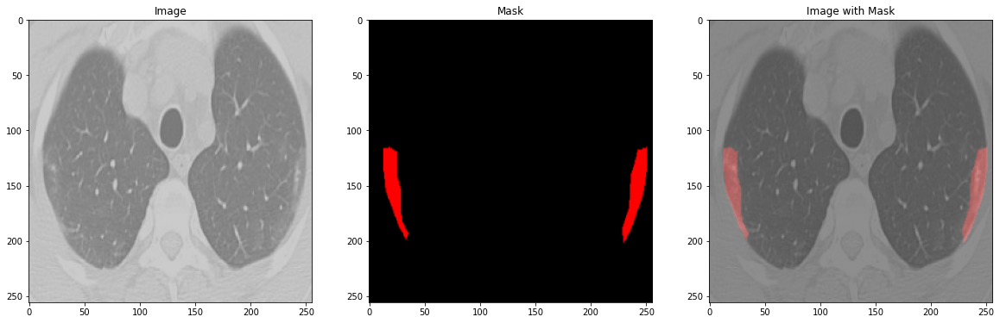

In [56]:
visualize(tf.cast(next(iter(train_dataset))[0][0], tf.uint8), next(iter(train_dataset))[1][0])

### **Creating and fitting model**

In [57]:
def resblock(X, f):
    X_copy = X
    
    X = Conv2D(f, kernel_size=(1, 1), kernel_initializer="he_normal")(X)
    X = BatchNormalization()(X)
    X = Activation("relu")(X)
    
    X = Conv2D(f, kernel_size=(3, 3), padding="same", kernel_initializer="he_normal")(X)
    X = BatchNormalization()(X)
    
    X_copy = Conv2D(f, kernel_size=(1, 1), kernel_initializer="he_normal")(X_copy)
    X_copy = BatchNormalization()(X_copy)
    
    X = Add()([X, X_copy])
    X = Activation("relu")(X)
    
    return X

def upsample_concat(x, skip):
    X = UpSampling2D((2, 2))(x)
    merge = Concatenate()([X, skip])
    
    return merge

In [58]:
input_shape = (256, 256, 3)
X_input = Input(input_shape)

conv_1 = Conv2D(16, 3, activation="relu", padding="same", kernel_initializer="he_normal")(X_input)
conv_1 = BatchNormalization()(conv_1)
conv_1 = Conv2D(16, 3, activation="relu", padding="same", kernel_initializer="he_normal")(conv_1)
conv_1 = BatchNormalization()(conv_1)
pool_1 = MaxPool2D((2,2))(conv_1)

conv_2 = resblock(pool_1, 32)
pool_2 = MaxPool2D((2,2))(conv_2)

conv_3 = resblock(pool_2, 64)
pool_3 = MaxPool2D((2,2))(conv_3)

conv_4 = resblock(pool_3, 128)
pool_4 = MaxPool2D((2,2))(conv_4)

conv_5 = resblock(pool_4, 256)

up_1 = upsample_concat(conv_5, conv_4)
up_1 = resblock(up_1, 128)

up_2 = upsample_concat(up_1, conv_3)
up_2 = resblock(up_2, 64)

up_3 = upsample_concat(up_2, conv_2)
up_3 = resblock(up_3, 32)

up_4 = upsample_concat(up_3, conv_1)
up_4 = resblock(up_4, 16)

output = Conv2D(3, (1,1), kernel_initializer="he_normal", padding="same", activation="sigmoid")(up_4)

model = Model(X_input, output)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d_27 (Conv2D)              (None, 256, 256, 16) 448         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_26 (BatchNo (None, 256, 256, 16) 64          conv2d_27[0][0]                  
__________________________________________________________________________________________________
conv2d_28 (Conv2D)              (None, 256, 256, 16) 2320        batch_normalization_26[0][0]     
____________________________________________________________________________________________

In [59]:
def iou(y_true, y_pred, smooth=1):
  intersection = K.sum(K.abs(y_true * y_pred), axis=[1, 2])
  union = K.sum(y_true, [1, 2]) + K.sum(y_pred, [1, 2]) - intersection
  iou = K.mean((intersection + smooth) / (union + smooth), axis=0)
  return iou

In [60]:
def scheduler(epoch, lr):
  if epoch < 5:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

In [61]:
loss = "binary_crossentropy"
optimizer = "adam"
metrics = [iou, Precision(), Recall()]
callbacks = [callback]

model.compile(optimizer=optimizer, loss=loss, metrics=metrics)

In [62]:
model.load_weights("/content/drive/MyDrive/Colab Notebooks/COVID_data/models/saved model/seg_model_w/weights")

In [63]:
history = model.fit(train_dataset, epochs=50, validation_data=test_dataset, callbacks=callbacks)

Epoch 1/50
5/5 [==============================] - 17s 3s/step - loss: 0.0208 - iou: 0.6710 - precision_4: 0.8651 - recall_4: 0.7803 - val_loss: 0.0101 - val_iou: 0.7335 - val_precision_4: 0.9672 - val_recall_4: 0.7989
Epoch 2/50
5/5 [==============================] - 12s 2s/step - loss: 0.0131 - iou: 0.6423 - precision_4: 0.9071 - recall_4: 0.8058 - val_loss: 0.0124 - val_iou: 0.7401 - val_precision_4: 0.9837 - val_recall_4: 0.7515
Epoch 3/50
5/5 [==============================] - 12s 2s/step - loss: 0.0103 - iou: 0.6150 - precision_4: 0.9358 - recall_4: 0.7979 - val_loss: 0.0102 - val_iou: 0.7289 - val_precision_4: 0.9890 - val_recall_4: 0.7698
Epoch 4/50
5/5 [==============================] - 12s 3s/step - loss: 0.0092 - iou: 0.5698 - precision_4: 0.9235 - recall_4: 0.8410 - val_loss: 0.0113 - val_iou: 0.6918 - val_precision_4: 0.9782 - val_recall_4: 0.7624
Epoch 5/50
5/5 [==============================] - 12s 3s/step - loss: 0.0079 - iou: 0.5620 - precision_4: 0.9553 - recall_4: 0.8

In [64]:
model.save_weights("/content/drive/MyDrive/Colab Notebooks/COVID_data/models/saved model/seg_model_w/weights")

# **Evaluating**

In [65]:
model.evaluate(test_dataset)

9/9 [==============================] - 1s 104ms/step - loss: 0.0068 - iou: 0.7008 - precision_4: 0.9596 - recall_4: 0.8870


[0.006781196221709251,
 0.7008431553840637,
 0.9595890641212463,
 0.8870269656181335]

In [66]:
def predict(img):
  img = resize(img, (256, 256))
  mask = model.predict(img[None, ...])
  return img, mask[0, ...]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


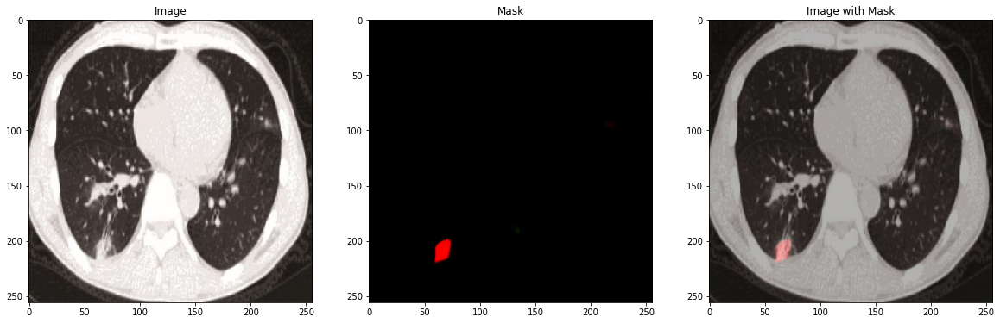

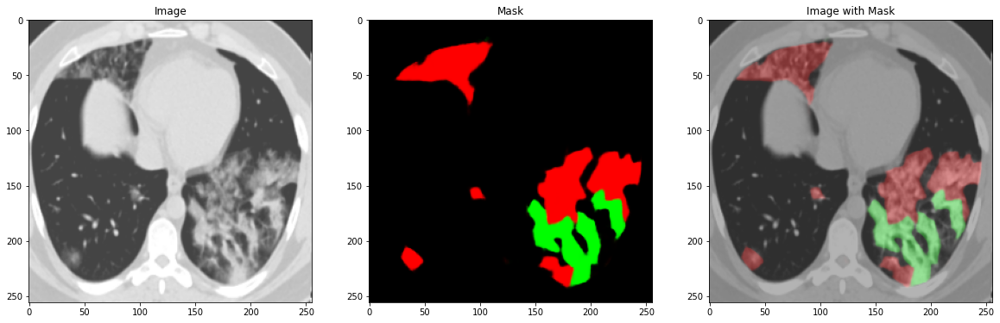

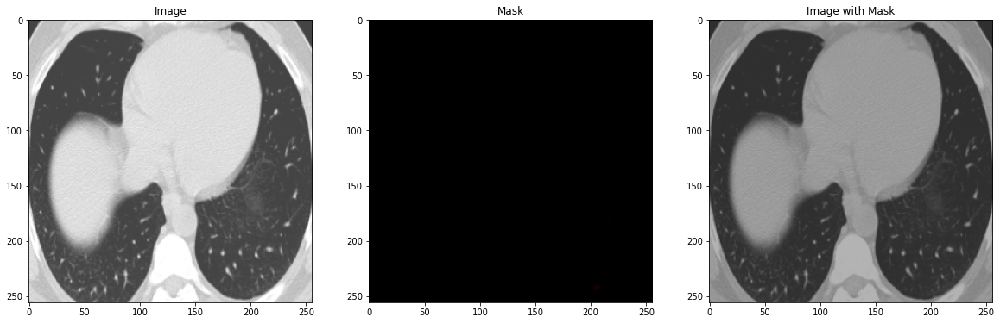

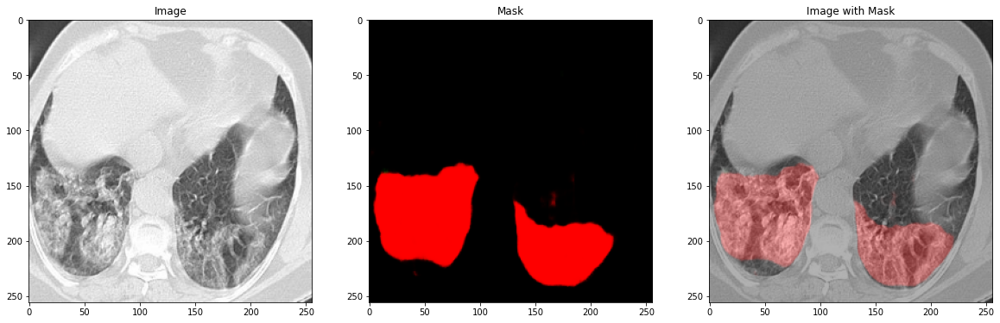

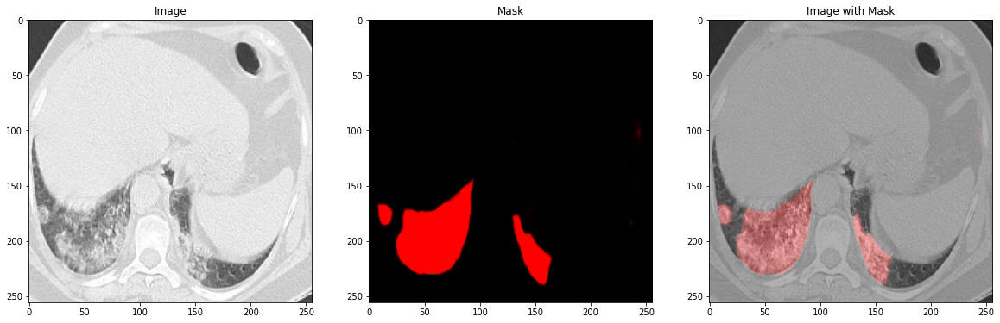

...

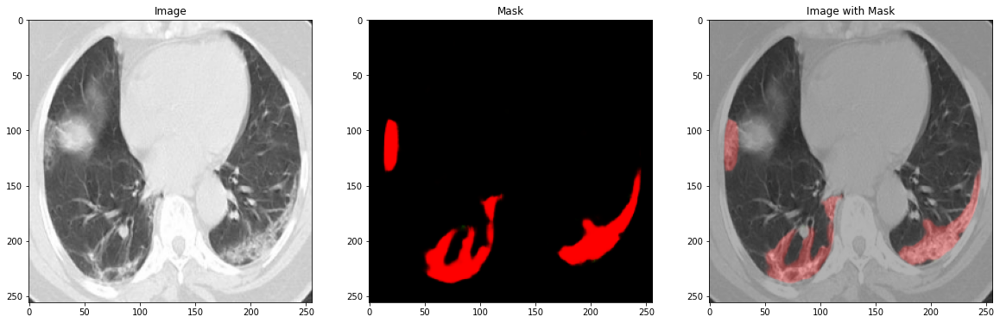

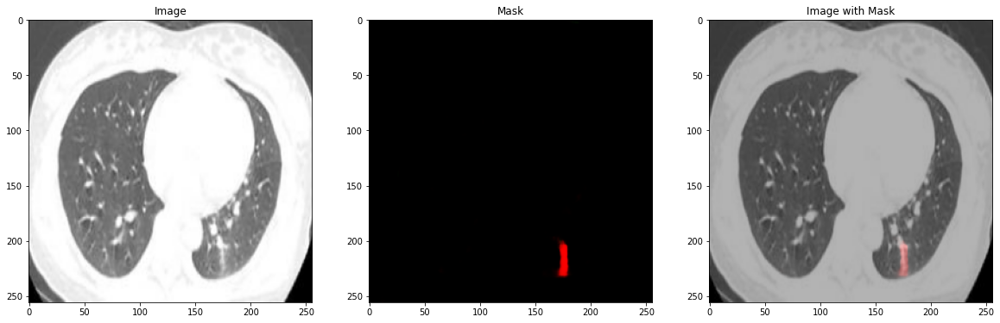

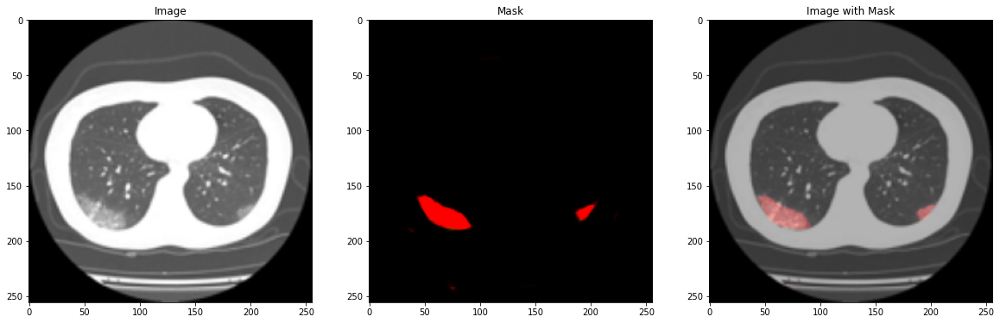

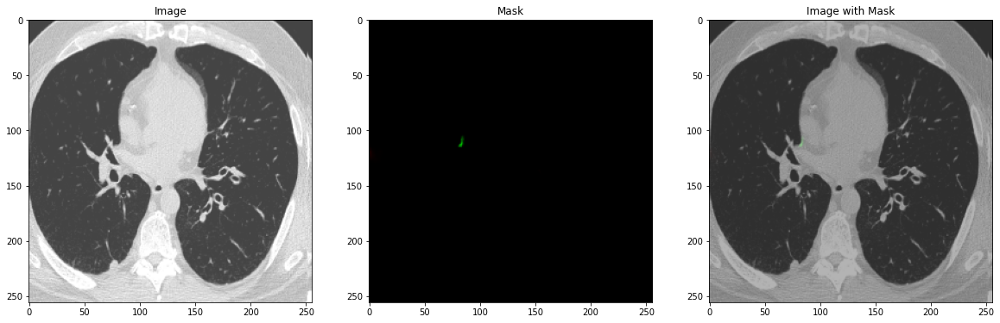

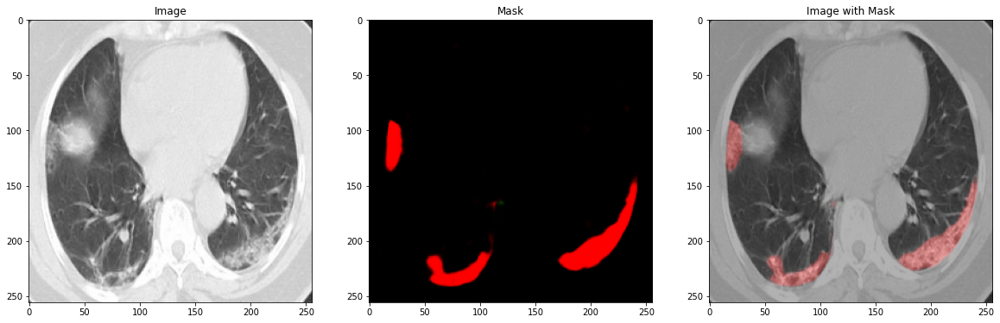

In [67]:
for img in test_ids:
  img = img_to_array(load_img(img))
  img, mask = predict(img)
  visualize(tf.cast(img, dtype=tf.uint8), mask, alpha=0.3)

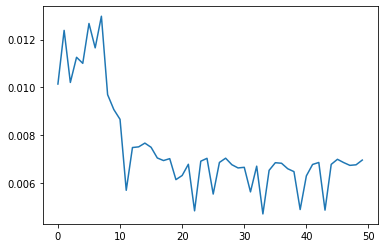

In [68]:
plt.plot(history.history["val_loss"])

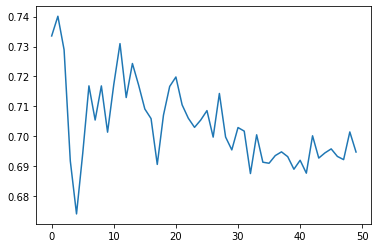

In [69]:
plt.plot(history.history["val_iou"])